# DOTA Aerial Object Detection - YOLOv11 Demo Project
By: Javier H.

Colab link: https://colab.research.google.com/drive/1mb9WWhO9-k271FvuFEUB8LfRGbXbcCN-?usp=sharing

---

This project demonstrates how to preprocess and train the [YOLOv11](https://docs.ultralytics.com/models/yolo11/) model on aerial imagery using sample data from the **DOTA v1.5** dataset.

## Dataset

- **DOTA** (Dataset for Object deTection in Aerial images): A large-scale benchmark for detecting oriented objects in aerial images.
- **Version**: v1.5 (used for demonstration; v2.0 is not in Google Drive); [Official site](https://captain-whu.github.io/DOTA/dataset.html)
- **Note**: YOLOv11 is typically trained on DOTA v1.0, but this project focuses more on **data transformation and preprocessing**, not benchmarking accuracy.

## Model

- **Model**: YOLOv11 Nano variant
- **Input Size**: 640×640 (default)

## Preprocessing & Data Transformation (Main Focus)

This project shows one of the processes I take to convert datasets into YOLO-compatible format, especially for datasets similar DOTA with oriented bounding boxes (OBB) or varying image resolution and sizes.

- **Tiling**: Images are split into overlapping tiles of 640×640 pixels (with black padding as needed)
- **Label Adjustment**:
  - Translates OBB annotations to fit each tile
  - Clamps bounding boxes to tile edges
  - Converts polygon OBBs to YOLO-oriented format (normalized coordinates)
  - Converts class names to integer indices
- **Why Tiling?**:
  - Prevents distortion from resizing non-square images
  - Preserves detail in high-resolution images
  - Improves detection of small, dense aerial objects

## Training

- Training is done using the transformed dataset
- Evaluation metrics, training logs, and visual results (e.g., predictions, confusion matrix, loss curves) are produced to monitor performance

This project focuses on **the process and pipeline** in training the YOLOv11 model.

## Experimentation

Experimentation is crucial in machine learning, so it is natural that there is trial and error present in the code. This is a Jupyter notebook after all. As a result, some cells have duplicate import statements due to running them individually for debugging purposes.

IMPORTANT: Do this installation first, otherwise the runtime will restart

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 54.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
def check_gpu_availability():
    gpu_found = False

    # Check PyTorch
    try:
        import torch
        if torch.cuda.is_available():
            print(f"[PyTorch] GPU detected: {torch.cuda.get_device_name(0)}")
            gpu_found = True
        else:
            print("[PyTorch] No GPU detected. Running on CPU.")
    except ImportError:
        print("[PyTorch] Not installed.")

    # Check TensorFlow
    try:
        import tensorflow as tf
        gpus = tf.config.list_physical_devices('GPU')
        if gpus:
            print(f"[TensorFlow] GPU detected: {gpus[0].name}")
            gpu_found = True
        else:
            print("[TensorFlow] No GPU detected. Running on CPU.")
    except ImportError:
        print("[TensorFlow] Not installed.")

    if not gpu_found:
        print("No GPU found for either PyTorch or TensorFlow.")
check_gpu_availability()

[PyTorch] GPU detected: Tesla T4
[TensorFlow] GPU detected: /physical_device:GPU:0


In [4]:
import zipfile
import os

def extract_zip(zip_base_path, split_path, extract_base_path, extract_path):
    """
    Extracts a split ZIP file from Drive into Colab.
    """
    zip_path = os.path.join(zip_base_path, f"{split_path}.zip")
    extract_total_path = os.path.join(extract_base_path, extract_path)

    print(f"Extracting {zip_path}...")
    os.makedirs(extract_total_path, exist_ok=True)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_total_path)

    print(f"Extracted to: {extract_total_path}")
    return extract_total_path

## Location and File Storage

I added shortcuts from the DOTA v1.5 dataset Google Drive files to my own google drive at the `zip_base_path` location in the folders as seen in the dir variables. This is an amazing way to retain Google Drive space while being able to access the dataset which is already hosted in Google Drive.

Since this is a demonstration, I only extract the first part of training images. Feel free to train on a greater sample by extracting more images.

In [5]:
zip_base_path = "/content/drive/MyDrive/Storage Bucket/ML/DOTA"
base_path = "/content/DOTA"

train_labels_dir = extract_zip(zip_base_path, "train/DOTA-v1.5_train", base_path, "train/labels")
train_images_dir = extract_zip(zip_base_path, "train/part1", base_path, "train") # No need for train/images as images is a folder within the extracted zip file
# train_images_dir = extract_zip(zip_base_path, "train/part2", base_path, "train")
# train_images_dir = extract_zip(zip_base_path, "train/part3", base_path, "train")
val_labels_dir = extract_zip(zip_base_path, "val/DOTA-v1.5_val", base_path, "val/labels")
val_images_dir = extract_zip(zip_base_path, "val/part1", base_path, "val")

Extracting /content/drive/MyDrive/Storage Bucket/ML/DOTA/train/DOTA-v1.5_train.zip...
Extracted to: /content/DOTA/train/labels
Extracting /content/drive/MyDrive/Storage Bucket/ML/DOTA/train/part1.zip...
Extracted to: /content/DOTA/train
Extracting /content/drive/MyDrive/Storage Bucket/ML/DOTA/val/DOTA-v1.5_val.zip...
Extracted to: /content/DOTA/val/labels
Extracting /content/drive/MyDrive/Storage Bucket/ML/DOTA/val/part1.zip...
Extracted to: /content/DOTA/val


In [6]:
# 80% train, 20% val
SAMPLE_TRAIN_IMAGES = 250 #@param {type:"slider", min:50, max:2000, step:50}
SAMPLE_VAL_IMAGES = 50   #@param {type:"slider", min:50, max:500, step:50}

In [7]:
import os
import shutil
import random

def sample_images_and_labels(
    image_src, label_src,
    image_dst, label_dst,
    num_samples
):
    """
    Sample images and  labels from source directories and copy them to destination directories.
    """

    os.makedirs(image_dst, exist_ok=True)
    os.makedirs(label_dst, exist_ok=True)

    # Clear previous files
    for f in os.listdir(image_dst): os.remove(os.path.join(image_dst, f))
    for f in os.listdir(label_dst): os.remove(os.path.join(label_dst, f))

    # Sample and copy
    all_images = [f for f in os.listdir(image_src) if f.endswith((".jpg", ".png", '.jpeg'))]
    sampled_images = random.sample(all_images, num_samples)
    print(str(len(all_images)) + " images found. Sampling " + str(num_samples) + " images...")

    for img in sampled_images:
        shutil.copy(os.path.join(image_src, img), os.path.join(image_dst, img))

        label_name = os.path.splitext(img)[0] + ".txt"
        label_src_path = os.path.join(label_src, label_name)
        if os.path.exists(label_src_path):
            shutil.copy(label_src_path, os.path.join(label_dst, label_name))

In [8]:
# Original dataset paths
train_img_dir = os.path.join(base_path, "train/images")
train_lbl_dir = os.path.join(base_path, "train/labels")
val_img_dir   = os.path.join(base_path, "val/images")
val_lbl_dir   = os.path.join(base_path, "val/labels")

# Sample output paths
sample_train_img = os.path.join(base_path, "sample_train_images")
sample_train_lbl = os.path.join(base_path, "sample_train_labels")
sample_val_img   = os.path.join(base_path, "sample_val_images")
sample_val_lbl   = os.path.join(base_path, "sample_val_labels")

# Run sampling
sample_images_and_labels(train_img_dir, train_lbl_dir, sample_train_img, sample_train_lbl, SAMPLE_TRAIN_IMAGES)
sample_images_and_labels(val_img_dir, val_lbl_dir, sample_val_img, sample_val_lbl, SAMPLE_VAL_IMAGES)

print("Sampled image/label sets created.")

469 images found. Sampling 250 images...
458 images found. Sampling 50 images...
Sampled image/label sets created.


In [9]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Directories
dirs = {
    "Train Images": "/content/DOTA/sample_train_images",
    "Train Labels": "/content/DOTA/sample_train_labels",
    "Val Images": "/content/DOTA/sample_val_images",
    "Val Labels": "/content/DOTA/sample_val_labels",
}

# Count number of files in each directory
print("Sample Counts:")
for name, path in dirs.items():
    count = len([f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))])
    print(f"{name}: {count}")

Sample Counts:
Train Images: 250
Train Labels: 250
Val Images: 50
Val Labels: 50


In [10]:
def show_sample_image(image_dir):
    """
    Display one sample training image and print its size
    """
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    if not image_files:
        print("No images found in:", image_dir)
        return None
    img_file = random.choice(image_files)
    img_path = os.path.join(image_dir, img_file)

    img = Image.open(img_path)
    width, height = img.size
    print(f"\nImage File: {img_file}")
    print(f"Size: {width} x {height}")

    plt.imshow(img)
    plt.title(f"Sample Train Image: {img_file}")
    plt.axis('off')
    plt.show()

    return img_file

In [11]:
def show_label(label_dir, image_filename):
    """
    Print matching label file
    """
    label_file = os.path.splitext(image_filename)[0] + ".txt"
    label_path = os.path.join(label_dir, label_file)

    print(f"\nLabel File: {label_file}")
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
            if lines:
                print("Contents:")
                for line in lines:
                    print("  ", line.strip())
            else:
                print("  (Empty file)")
    else:
        print("  Label file not found.")


Image File: P0263.png
Size: 676 x 807


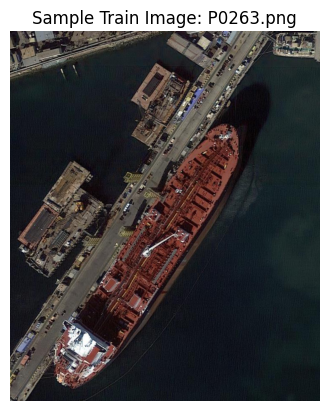


Label File: P0263.txt
Contents:
   imagesource:GoogleEarth
   gsd:0.275750561232
   294.0 500.0 283.0 479.0 362.0 433.0 369.0 450.0 helicopter 1
   452.0 179.0 542.0 237.0 160.0 806.0 62.0 736.0 ship 0


In [12]:
sample_image = show_sample_image(dirs["Train Images"])
if sample_image:
    show_label(dirs["Train Labels"], sample_image)

## DOTA Annotation Format

Source: https://captain-whu.github.io/DOTA/dataset.html

Each annotation file corresponds to an image and contains one object per line, using an Oriented Bounding Box (OBB):

### Annotation Line Format

```
x1, y1, x2, y2, x3, y3, x4, y4, category, difficult
```

| Field        | Description                                                    |
|--------------|----------------------------------------------------------------|
| x1, y1       | Top-left corner of the bounding box                            |
| x2, y2       | Top-right corner (clockwise order)                             |
| x3, y3       | Bottom-right corner                                            |
| x4, y4       | Bottom-left corner                                             |
| category     | Object class name (e.g., plane, ship, bridge, etc.)            |
| difficult    | 0 = easy, 1 = difficult to detect                               |

All coordinates define the four corners of a rotated rectangle in **clockwise order**.

---

### Object Categories by DOTA Version

| DOTA Version | Categories (cumulative)                                                           |
|--------------|------------------------------------------------------------------------------------|
| v1.0         | plane, ship, storage tank, baseball diamond, tennis court, basketball court, ground track field, harbor, bridge, large vehicle, small vehicle, helicopter, roundabout, soccer ball field, swimming pool |
| v1.5         | All of v1.0 + container crane                                                     |
| v2.0         | All of v1.5 + airport, helipad                                                    |

We are using DOTA v1.5 since DOTA v2.0 is not available in Google Drive.

---

### Metadata Format (First 3 Lines of Label File)

| Line Number | Field             | Description                                       |
|-------------|------------------|---------------------------------------------------|
| 1           | acquisition dates | Date the image was captured, or `None`           |
| 2           | imagesource       | Source of image (e.g., `GoogleEarth`, `GF-2`, `JL-1`) |
| 3           | gsd               | Ground Sample Distance in meters, or `None`      |

In [13]:
def remove_metadata(label_path):
    """
    Removes metadata lines at the start of a DOTA label file.
    Metadata lines start with 'acquisition dates:', 'imagesource:', or 'gsd:'.
    Writes the cleaned content back to the same file.

    Args:
        label_path (str): Path to the label text file.
    """
    metadata_keys = {'acquisition dates:', 'imagesource:', 'gsd:'}
    cleaned_lines = []

    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Skip metadata lines from the top
    idx = 0
    while idx < len(lines):
        line_lower = lines[idx].strip().lower()
        if any(line_lower.startswith(key) for key in metadata_keys):
            idx += 1
        else:
            break

    # Keep the rest of the lines
    cleaned_lines = lines[idx:]

    # Overwrite the file without metadata
    with open(label_path, 'w') as f:
        f.writelines(cleaned_lines)

In [14]:
import os
import math
from PIL import Image
import numpy as np

def tile_image_with_labels(
    image_path,
    label_path,
    output_img_dir,
    output_lbl_dir,
    tile_size=640,
    overlap=0.25
):
    """
    Tile an image and adjust its DOTA OBB labels accordingly.

    Parameters:
        image_path (str): Path to the original image.
        label_path (str): Path to the label text file.
        output_img_dir (str): Directory to save image tiles.
        output_lbl_dir (str): Directory to save adjusted labels.
        tile_size (int): Size of the square tile.
        overlap (float): Fraction of overlap (e.g., 0.25 = 25%).
    """
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_lbl_dir, exist_ok=True)

    img = Image.open(image_path).convert('RGB')
    img_w, img_h = img.size

    stride = int(tile_size * (1 - overlap))
    obb_data = []

    # Read original labels
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            coords = list(map(float, parts[:8]))
            cls = parts[8]
            difficult = parts[9]
            obb_data.append((coords, cls, difficult))

    tile_id = 0
    for y in range(0, img_h, stride):
        for x in range(0, img_w, stride):
            x_end = min(x + tile_size, img_w)
            y_end = min(y + tile_size, img_h)

            # Crop and pad image tile
            tile = img.crop((x, y, x_end, y_end))
            tile_w, tile_h = tile.size
            if tile_w < tile_size or tile_h < tile_size:
                padded_tile = Image.new('RGB', (tile_size, tile_size), (0, 0, 0))
                padded_tile.paste(tile, (0, 0))
                tile = padded_tile

            tile_filename = f"{os.path.splitext(os.path.basename(image_path))[0]}_{tile_id:04}.png"
            tile_path = os.path.join(output_img_dir, tile_filename)
            tile.save(tile_path)

            # Filter and adjust labels for this tile
            adjusted_labels = []
            for coords, cls, difficult in obb_data:
                coords_arr = np.array(coords).reshape(4, 2)
                min_x, min_y = coords_arr.min(axis=0)
                max_x, max_y = coords_arr.max(axis=0)

                if (max_x < x) or (min_x > x_end) or (max_y < y) or (min_y > y_end):
                    continue  # Completely outside

                # Translate and clamp coordinates
                shifted_coords = []
                for px, py in coords_arr:
                    new_x = px - x
                    new_y = py - y
                    new_x = min(max(new_x, 0), tile_size - 1)
                    new_y = min(max(new_y, 0), tile_size - 1)
                    shifted_coords.extend([new_x, new_y])

                adjusted_labels.append(" ".join(map(str, shifted_coords)) + f" {cls} {difficult}")

            # Save adjusted labels
            label_filename = tile_filename.replace(".png", ".txt")
            label_path_out = os.path.join(output_lbl_dir, label_filename)
            with open(label_path_out, 'w') as out_f:
                out_f.write("\n".join(adjusted_labels))

            tile_id += 1

    return tile_id

In [15]:
import glob
import os

def batch_tile_dataset(
    image_dir,
    label_dir,
    out_img_dir,
    out_lbl_dir,
    tile_size=640,
    overlap=0.25
):
    os.makedirs(out_img_dir, exist_ok=True)
    os.makedirs(out_lbl_dir, exist_ok=True)

    image_paths = glob.glob(os.path.join(image_dir, "*.*"))
    count_tiles = 0

    for img_path in image_paths:
        img_name = os.path.splitext(os.path.basename(img_path))[0]
        lbl_path = os.path.join(label_dir, img_name + ".txt")

        if not os.path.exists(lbl_path):
            print(f"Label not found for {img_name}, skipping.")
            continue

        # Remove metadata lines from label file before processing
        remove_metadata(lbl_path)

        n_tiles = tile_image_with_labels(
            img_path,
            lbl_path,
            out_img_dir,
            out_lbl_dir,
            tile_size=tile_size,
            overlap=overlap
        )
        count_tiles += n_tiles
        print(f"Processed {img_name}, created {n_tiles} tiles.")

    print(f"Total tiles created: {count_tiles}")

In [16]:
# batch_tile_dataset(
#     image_dir="/content/DOTA/sample_train_images",
#     label_dir="/content/DOTA/sample_train_labels_raw",
#     out_img_dir="/content/DOTA/tiles/train/images",
#     out_lbl_dir="/content/DOTA/tiles/train/labels_raw",
#     tile_size=640,
#     overlap=0.25
# )

# batch_tile_dataset(
#     image_dir="/content/DOTA/sample_val_images",
#     label_dir="/content/DOTA/sample_val_labels_raw",
#     out_img_dir="/content/DOTA/tiles/val/images",
#     out_lbl_dir="/content/DOTA/tiles/val/labels_raw",
#     tile_size=640,
#     overlap=0.25
# )

## Optimizing via multi-processing
The above is too slow to be used for large datasets. We instead try multi-processing and use a faster library (cv2)

In [17]:
import numpy as np
import cv2
import os

def tile_image_with_labels_cv2(
    image_path,
    label_path,
    output_img_dir,
    output_lbl_dir,
    tile_size=640,
    overlap=0.25
):
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_lbl_dir, exist_ok=True)

    img = cv2.imread(image_path)
    img_h, img_w = img.shape[:2]

    stride = int(tile_size * (1 - overlap))

    obb_data = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            coords = list(map(float, parts[:8]))
            cls = parts[8]
            obb_data.append((coords, cls))

    tile_id = 0
    for y in range(0, img_h, stride):
        for x in range(0, img_w, stride):
            x_end = min(x + tile_size, img_w)
            y_end = min(y + tile_size, img_h)

            tile = img[y:y_end, x:x_end]

            # Pad if smaller than tile_size
            pad_bottom = tile_size - tile.shape[0]
            pad_right = tile_size - tile.shape[1]
            if pad_bottom > 0 or pad_right > 0:
                tile = cv2.copyMakeBorder(tile, 0, pad_bottom, 0, pad_right, cv2.BORDER_CONSTANT, value=[0,0,0])

            tile_filename = f"{os.path.splitext(os.path.basename(image_path))[0]}_{tile_id:04}.png"
            tile_path = os.path.join(output_img_dir, tile_filename)
            cv2.imwrite(tile_path, tile)

            adjusted_labels = []
            for coords, cls in obb_data:
                coords_arr = np.array(coords).reshape(4, 2)
                min_x, min_y = coords_arr.min(axis=0)
                max_x, max_y = coords_arr.max(axis=0)

                # Skip if polygon completely outside tile
                if (max_x < x) or (min_x > x_end) or (max_y < y) or (min_y > y_end):
                    continue

                shifted_coords = []
                for px, py in coords_arr:
                    # Shift to tile coords and clip
                    new_x = px - x
                    new_y = py - y
                    new_x = np.clip(new_x, 0, tile_size - 1)
                    new_y = np.clip(new_y, 0, tile_size - 1)
                    shifted_coords.extend([new_x, new_y])

                # Optional: check for polygon validity (e.g., minimum area or distinct points)
                # If invalid, skip
                pts = np.array(shifted_coords).reshape(4, 2)
                if np.linalg.matrix_rank(pts - pts[0]) < 2:
                    # Degenerate polygon, skip
                    continue

                adjusted_labels.append(" ".join(map(str, shifted_coords)) + f" {cls}")

            label_filename = tile_filename.replace(".png", ".txt")
            label_path_out = os.path.join(output_lbl_dir, label_filename)
            with open(label_path_out, 'w') as out_f:
                out_f.write("\n".join(adjusted_labels))

            tile_id += 1

    return tile_id

In [18]:
def process_single_image(args):
    img_path, lbl_path, out_img_dir, out_lbl_dir, tile_size, overlap = args

    if not os.path.exists(lbl_path):
        print(f"Label not found for {os.path.basename(img_path)}, skipping.")
        return 0

    remove_metadata(lbl_path)
    n_tiles = tile_image_with_labels_cv2(
        img_path, lbl_path, out_img_dir, out_lbl_dir, tile_size, overlap
    )
    print(f"Processed {os.path.basename(img_path)}, created {n_tiles} tiles.")
    return n_tiles

In [19]:
from multiprocessing import Pool, cpu_count

def batch_tile_dataset_parallel(
    image_dir,
    label_dir,
    out_img_dir,
    out_lbl_dir,
    tile_size=640,
    overlap=0.25,
    num_workers=None
):
    os.makedirs(out_img_dir, exist_ok=True)
    os.makedirs(out_lbl_dir, exist_ok=True)

    image_paths = glob.glob(os.path.join(image_dir, "*.*"))
    if num_workers is None:
        num_workers = max(1, cpu_count() - 1)

    args_list = []
    for img_path in image_paths:
        img_name = os.path.splitext(os.path.basename(img_path))[0]
        lbl_path = os.path.join(label_dir, img_name + ".txt")
        args_list.append((img_path, lbl_path, out_img_dir, out_lbl_dir, tile_size, overlap))

    with Pool(num_workers) as pool:
        results = pool.map(process_single_image, args_list)

    total_tiles = sum(results)
    print(f"Total tiles created: {total_tiles}")

In [20]:
TILE_SIZE = 640 #@param {type:"slider", min:320, max:1280, step:32}
TILE_OVERLAP = 0.25 #@param {type:"slider", min:0, max:1, step:0.05}

In [21]:
batch_tile_dataset_parallel(
    image_dir="/content/DOTA/sample_train_images",
    label_dir="/content/DOTA/sample_train_labels",
    out_img_dir="/content/DOTA/tiles/train/images",
    out_lbl_dir="/content/DOTA/tiles/train/labels_raw",
    tile_size=TILE_SIZE,
    overlap=TILE_OVERLAP
)

batch_tile_dataset_parallel(
    image_dir="/content/DOTA/sample_val_images",
    label_dir="/content/DOTA/sample_val_labels",
    out_img_dir="/content/DOTA/tiles/val/images",
    out_lbl_dir="/content/DOTA/tiles/val/labels_raw",
    tile_size=TILE_SIZE,
    overlap=TILE_OVERLAP
)

Processed P0422.png, created 4 tiles.
Processed P0010.png, created 16 tiles.
Processed P0724.png, created 12 tiles.
Processed P0554.png, created 6 tiles.
Processed P0076.png, created 4 tiles.
Processed P0826.png, created 6 tiles.
Processed P0248.png, created 6 tiles.
Processed P0586.png, created 6 tiles.
Processed P0227.png, created 15 tiles.
Processed P0883.png, created 9 tiles.
Processed P0400.png, created 6 tiles.
Processed P0260.png, created 16 tiles.
Processed P0355.png, created 4 tiles.
Processed P0417.png, created 6 tiles.
Processed P0415.png, created 6 tiles.
Processed P0691.png, created 4 tiles.
Processed P0727.png, created 12 tiles.
Processed P0521.png, created 12 tiles.
Processed P0728.png, created 15 tiles.
Processed P0011.png, created 12 tiles.
Processed P0505.png, created 8 tiles.
Processed P0002.png, created 30 tiles.
Processed P0542.png, created 4 tiles.
Processed P0289.png, created 9 tiles.
Processed P0070.png, created 9 tiles.
Processed P0000.png, created 108 tiles.
P

## Visualizing the tiles and the OBBs
Before converting to the OBB label format as required by YOLO, we can do a preliminary visualization of the tiles themselves and the OBBs on the labelled objects.

Update: We modify the methods after to allow visualization of the YOLO obb formats.

In [22]:
# Class mapping
class_to_index = {
    "plane": 0,
    "ship": 1,
    "storage-tank": 2,
    "baseball-diamond": 3,
    "tennis-court": 4,
    "basketball-court": 5,
    "ground-track-field": 6,
    "harbor": 7,
    "bridge": 8,
    "large-vehicle": 9,
    "small-vehicle": 10,
    "helicopter": 11,
    "roundabout": 12,
    "soccer-ball-field": 13,
    "swimming-pool": 14,
    "container-crane": 15
}

# Reverse mapping
index_to_class = {v: k for k, v in class_to_index.items()}

In [23]:
def draw_obb(image, obbs, color=(0, 255, 0), thickness=2):
    """
    Draws oriented bounding boxes (OBBs) on an image.

    Args:
        image (np.ndarray): Input image.
        obbs (List[Tuple[str, List[Tuple[float, float]]]]): List of OBBs with class name and 4 points.
    """
    for class_name, points in obbs:
        pts = np.array(points, dtype=np.int32).reshape((-1, 1, 2))
        cv2.polylines(image, [pts], isClosed=True, color=color, thickness=thickness)
        x, y = int(points[0][0]), int(points[0][1])
        cv2.putText(image, class_name, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    (0, 255, 255), 1, cv2.LINE_AA)
    return image

In [24]:
def read_label_file(label_path, is_yolo=False, index_to_class=None, image_shape=None):
    """
    Reads a label file and returns oriented bounding boxes with class names.

    Args:
        label_path (str): Path to the label file.
        is_yolo (bool): Whether the label file is in YOLO format.
        index_to_class (dict): Mapping from class index to class name (for YOLO).
        image_shape (Tuple[int, int]): (height, width) of the image (required for YOLO format).

    Returns:
        List[Tuple[str, List[Tuple[float, float]]]]: (class_name, list of 4 points)
    """
    obbs = []

    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 9:
                continue

            if is_yolo:
                if image_shape is None:
                    raise ValueError("image_shape must be provided for YOLO label decoding.")

                class_index = int(parts[0])
                coords = list(map(float, parts[1:9]))

                img_h, img_w = image_shape
                # Convert relative [0,1] to absolute coordinates
                abs_coords = [
                    (coords[i] * img_w, coords[i + 1] * img_h)
                    for i in range(0, 8, 2)
                ]
                class_name = index_to_class.get(class_index, f"class_{class_index}")
                obbs.append((class_name, abs_coords))
            else:
                coords = list(map(float, parts[:8]))
                points = [(coords[i], coords[i + 1]) for i in range(0, 8, 2)]
                class_name = parts[8]
                obbs.append((class_name, points))

    return obbs

In [25]:
def render_image_with_obbs(image_path, label_path, is_yolo=False, index_to_class=None):
    """
    Loads image and overlays oriented bounding boxes.

    Args:
        image_path (str): Path to image file.
        label_path (str): Path to label file.
        is_yolo (bool): Whether to interpret labels as YOLO format.
        index_to_class (dict): Mapping for YOLO format.

    Returns:
        np.ndarray: Image with OBBs drawn.
    """
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if os.path.exists(label_path):
        img_h, img_w = image.shape[:2]
        obbs = read_label_file(label_path, is_yolo=is_yolo, index_to_class=index_to_class, image_shape=(img_h, img_w))
        image = draw_obb(image, obbs)

    return image

In [26]:
def visualize_tiled_image_grid(
    tile_img_dir,
    tile_lbl_dir,
    tile_prefix=None,
    tile_size=640,
    cols=4,
    figsize=(16, 12),
    is_yolo=False,
    index_to_class=None
):
    """
    Displays tiled subimages with bounding boxes in a grid.

    Args:
        tile_img_dir (str): Directory containing the tiled images.
        tile_lbl_dir (str): Directory containing the tiled label files.
        tile_prefix (str): Prefix of the tiled files to match the original image.
        tile_size (int): Size of each tile (default is 640).
        cols (int): Number of columns in the tile grid.
        figsize (Tuple[int, int]): Size of the entire figure for the tile grid.
        is_yolo (bool): Whether the labels are in YOLO format.
        index_to_class (dict): Class index → name map for YOLO format.
    """
    tile_imgs = sorted(glob.glob(os.path.join(tile_img_dir, f"{tile_prefix}_*.png")))
    num_tiles = len(tile_imgs)
    rows = (num_tiles + cols - 1) // cols

    fig, axs = plt.subplots(rows, cols, figsize=figsize)
    axs = axs.flatten()

    for i, tile_path in enumerate(tile_imgs):
        tile_name = os.path.splitext(os.path.basename(tile_path))[0]
        label_path = os.path.join(tile_lbl_dir, tile_name + ".txt")

        tile_img = render_image_with_obbs(
            tile_path,
            label_path,
            is_yolo=is_yolo,
            index_to_class=index_to_class
        )

        axs[i].imshow(tile_img)
        axs[i].set_title(tile_name, fontsize=8)
        axs[i].axis('off')

    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.suptitle("Tiled Images with OBBs", fontsize=14, y=1.02)
    plt.show()

In [27]:
def visualize_sample_and_tiles(
    sample_name,
    image_path,
    label_path,
    tile_img_dir,
    tile_lbl_dir,
    is_yolo=False,
    index_to_class=None
):
    """
    Visualizes the original image and its tiles with OBBs.

    Args:
        sample_name (str): Name of the sample (no extension).
        image_path (str): Path to the image.
        label_path (str): Path to the label file.
        tile_img_dir (str): Directory with tiled images.
        tile_lbl_dir (str): Directory with tiled label files.
        is_yolo (bool): If using YOLO-format labels.
        index_to_class (dict): For YOLO class name decoding.
    """
    rendered = render_image_with_obbs(
        image_path,
        label_path,
        is_yolo=is_yolo,
        index_to_class=index_to_class
    )

    plt.figure(figsize=(8, 8))
    plt.title(f"Original Image: {sample_name}")
    plt.imshow(rendered)
    plt.axis('off')
    plt.show()

    visualize_tiled_image_grid(
        tile_img_dir=tile_img_dir,
        tile_lbl_dir=tile_lbl_dir,
        tile_prefix=sample_name,
        is_yolo=is_yolo,
        index_to_class=index_to_class
    )

In [28]:
def select_random_sample(train_img_dir, train_lbl_dir):
    """
    Randomly selects a sample image and label file from the dataset.

    Args:
        train_img_dir (str): Directory with training images.
        train_lbl_dir (str): Directory with corresponding label files.

    Returns:
        Tuple[str, str, str, str]: (sample_name, image_path, label_path, image_file_name)
    """
    image_files = [f for f in os.listdir(train_img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not image_files:
        raise FileNotFoundError("No training images found in the specified directory.")

    sample_file = random.choice(image_files)
    sample_name = os.path.splitext(sample_file)[0]

    image_path = os.path.join(train_img_dir, sample_file)
    label_path = os.path.join(train_lbl_dir, sample_name + ".txt")

    return sample_name, image_path, label_path, sample_file

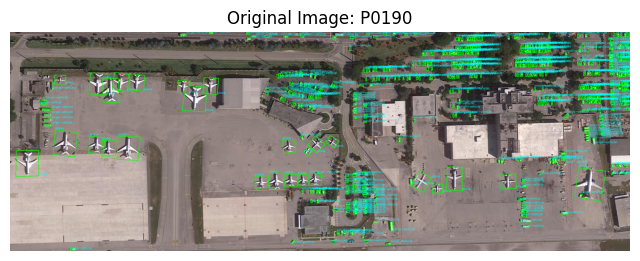

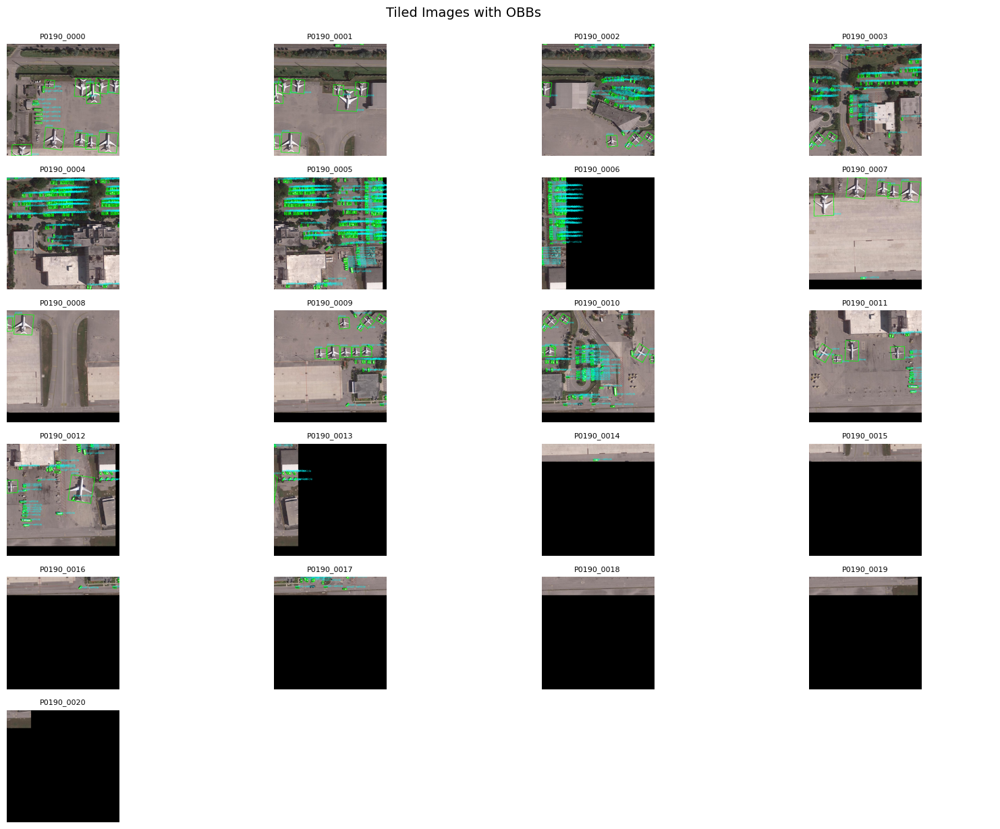

In [29]:
sample_name, image_path, label_path, sample_file = select_random_sample(
    train_img_dir="/content/DOTA/sample_train_images",
    train_lbl_dir="/content/DOTA/sample_train_labels"
)

visualize_sample_and_tiles(
    sample_name=sample_name,
    image_path=image_path,
    label_path=label_path,
    tile_img_dir="/content/DOTA/tiles/train/images",
    tile_lbl_dir="/content/DOTA/tiles/train/labels_raw",
    is_yolo=False,
    index_to_class=index_to_class
)

## YOLO v11 OBB Data Format
https://docs.ultralytics.com/datasets/obb/

> The YOLO OBB format designates bounding boxes by their four corner points with coordinates normalized between 0 and 1. It follows this format:

```
class_index x1 y1 x2 y2 x3 y3 x4 y4
```

In [30]:
import os
import cv2
import numpy as np

def convert_label_to_yolo_obb_format(src_label_path, dest_label_path, class_to_index, image_width, image_height):
    """
    Convert a label file polygon coords to YOLOv11 OBB polygon format:
    class_index x1 y1 x2 y2 x3 y3 x4 y4
    (all coordinates normalized to [0,1])

    Args:
        src_label_path (str): Path to source polygon label file.
        dest_label_path (str): Path to save YOLOv11 polygon format label.
        class_to_index (dict): Mapping from class name to integer index.
        image_width (int): Width of the image.
        image_height (int): Height of the image.
    """
    with open(src_label_path, 'r') as f:
        lines = f.readlines()

    yolo_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 9:
            continue

        coords = list(map(float, parts[:8]))
        class_name = parts[8]
        if class_name not in class_to_index:
            print(f"Warning: Unknown class '{class_name}' in {src_label_path}")
            continue

        class_index = class_to_index[class_name]

        # Normalize each coordinate
        normalized_coords = []
        for i in range(0, 8, 2):
            x_norm = coords[i] / image_width
            y_norm = coords[i+1] / image_height
            normalized_coords.extend([x_norm, y_norm])

        # Format line: class_index x1 y1 x2 y2 x3 y3 x4 y4
        yolo_line = f"{class_index} " + " ".join(f"{c:.6f}" for c in normalized_coords)
        yolo_lines.append(yolo_line)

    os.makedirs(os.path.dirname(dest_label_path), exist_ok=True)
    with open(dest_label_path, 'w') as f:
        f.write("\n".join(yolo_lines))

In [31]:
def convert_label_worker(args):
    src_label_path, dest_label_path, image_path, class_to_index = args

    if not os.path.exists(image_path):
        print(f"Warning: Image not found for {src_label_path}")
        return None

    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Failed to load image {image_path}")
        return None

    height, width = image.shape[:2]
    convert_label_to_yolo_obb_format(src_label_path, dest_label_path, class_to_index, width, height)
    return os.path.basename(src_label_path)

In [32]:
def convert_labels_dataset_parallel(
    label_dir,
    yolo_label_dir,
    class_to_index,
    image_dir,
    image_ext=".png",
    num_workers=None
):
    """
    Convert all label files in label_dir to YOLOv11 OBB format in parallel.

    Args:
        label_dir (str): Directory with processed label files.
        yolo_label_dir (str): Output directory for YOLO formatted labels.
        class_to_index (dict): Mapping from class name to class index.
        image_dir (str): Directory containing corresponding images.
        image_ext (str): Image file extension (e.g., ".png", ".jpg").
        num_workers (int, optional): Number of parallel workers.
    """
    os.makedirs(yolo_label_dir, exist_ok=True)

    label_files = glob.glob(os.path.join(label_dir, "*.txt"))
    args_list = []
    for src_path in label_files:
        fname = os.path.basename(src_path)
        dest_path = os.path.join(yolo_label_dir, fname)
        image_name = os.path.splitext(fname)[0] + image_ext
        image_path = os.path.join(image_dir, image_name)
        args_list.append((src_path, dest_path, image_path, class_to_index))

    if num_workers is None:
        num_workers = max(1, cpu_count() - 1)

    total_converted = 0
    with Pool(num_workers) as pool:
        for result in pool.imap_unordered(convert_label_worker, args_list):
            if result is not None:
                print(f"Converted {result}")
                total_converted += 1

    print(f"Total labels converted: {total_converted}")

In [33]:
convert_labels_dataset_parallel(
    label_dir="/content/DOTA/tiles/train/labels_raw",
    yolo_label_dir="/content/DOTA/tiles/train/labels",
    class_to_index=class_to_index,
    image_dir="/content/DOTA/tiles/train/images",
    image_ext=".png"
)

convert_labels_dataset_parallel(
    label_dir="/content/DOTA/tiles/val/labels_raw",
    yolo_label_dir="/content/DOTA/tiles/val/labels",
    class_to_index=class_to_index,
    image_dir="/content/DOTA/tiles/val/images",
    image_ext=".png"
)

Streaming output truncated to the last 5000 lines.
Converted P0785_0023.txt
Converted P0728_0005.txt
Converted P0537_0012.txt
Converted P0289_0001.txt
Converted P0340_0018.txt
Converted P0219_0010.txt
Converted P0141_0029.txt
Converted P0025_0030.txt
Converted P0167_0067.txt
Converted P0219_0000.txt
Converted P0188_0004.txt
Converted P0272_0002.txt
Converted P0188_0001.txt
Converted P0000_0098.txt
Converted P0209_0021.txt
Converted P0042_0017.txt
Converted P0573_0005.txt
Converted P0315_0007.txt
Converted P0516_0003.txt
Converted P0733_0008.txt
Converted P0025_0018.txt
Converted P0343_0011.txt
Converted P0587_0001.txt
Converted P0868_0021.txt
Converted P0221_0006.txt
Converted P0162_0010.txt
Converted P0054_0002.txt
Converted P0722_0002.txt
Converted P0099_0004.txt
Converted P0840_0006.txt
Converted P0250_0006.txt
Converted P0733_0003.txt
Converted P0038_0001.txt
Converted P0800_0006.txt
Converted P0167_0012.txt
Converted P0036_0038.txt
Converted P0892_0015.txt
Converted P0036_0028.txt

In [34]:
def count_files(dir_path, exts=('.png', '.jpg', '.jpeg', '.txt')):
    """
    Modularize file counting
    """
    if not os.path.exists(dir_path):
        return 0
    return len([f for f in os.listdir(dir_path) if f.lower().endswith(exts)])

In [35]:
def print_dataset_counts(base_path):
    splits = ['train', 'val']
    for split in splits:
        img_dir = os.path.join(base_path, split, 'images')
        lbl_dir = os.path.join(base_path, split, 'labels_raw')
        yolo_lbl_dir = os.path.join(base_path, split, 'labels')

        n_imgs = count_files(img_dir, exts=('.png', '.jpg', '.jpeg'))
        n_lbls = count_files(lbl_dir, exts=('.txt',))
        n_yolo = count_files(yolo_lbl_dir, exts=('.txt',))

        print(f"{split.upper()} dataset:")
        print(f"  Images: {n_imgs}")
        print(f"  Raw Labels: {n_lbls}")
        print(f"  YOLO Labels: {n_yolo}")
        print()

In [36]:
print_dataset_counts("/content/DOTA/tiles")

TRAIN dataset:
  Images: 3552
  Raw Labels: 3552
  YOLO Labels: 3552

VAL dataset:
  Images: 1692
  Raw Labels: 1692
  YOLO Labels: 1692



In [37]:
import yaml
import os

def generate_yolo_yaml(
    yaml_path,
    train_images_dir,
    val_images_dir,
    class_to_index,
    obb=True
):
    """
    Generate a YOLO dataset YAML file.

    Args:
        yaml_path (str): Output path for YAML file.
        train_images_dir (str): Path to training images.
        val_images_dir (str): Path to validation images.
        class_to_index (dict): Class name to index mapping.
        obb (bool): If True, include obb=True for YOLOv11 OBB support.
    """
    data = {
        'train': train_images_dir,
        'val': val_images_dir,
        'names': [None] * (max(class_to_index.values()) + 1)
    }

    for name, idx in class_to_index.items():
        data['names'][idx] = name

    if obb:
        data['obb'] = True

    os.makedirs(os.path.dirname(yaml_path), exist_ok=True)

    with open(yaml_path, 'w') as f:
        yaml.dump(data, f, default_flow_style=False)

    print(f"YOLO YAML saved to: {yaml_path}")

In [38]:
generate_yolo_yaml(
    yaml_path="/content/dota.yaml",
    train_images_dir="/content/DOTA/tiles/train/images",
    val_images_dir="/content/DOTA/tiles/val/images",
    class_to_index=class_to_index
)

YOLO YAML saved to: /content/dota.yaml


## Model training

As stated in the introduction, this project focuses on the data transformation process. Of course, training for longer (more epochs; ultralytics recommends 300!) will allow for better results (e.g. mAP), but this is a demonstration of the workflow so it is not necessary.

In [42]:
NUM_EPOCHS = 20 #@param {type:"slider", min:1, max:50, step:1}
BATCH_SIZE = 32 #@param {type:"slider", min:2, max:512, step:8}
NUM_WORKERS = 8 #@param {type:"slider", min:1, max:16, step:1}
SAVE_PERIOD = 5 #@param {type:"slider", min:1, max:20, step:1}
PATIENCE = 3 #@param {type:"slider", min:1, max:20, step:1}

In [40]:
import os
from ultralytics import YOLO, settings

settings.tensorboard = True

model = YOLO("yolo11n.pt")

model.train(
    data='/content/dota.yaml',
    epochs=NUM_EPOCHS,
    imgsz=TILE_SIZE,
    batch=BATCH_SIZE,
    workers=NUM_WORKERS,
    patience=PATIENCE,
    device='cuda',
    project=os.path.join(zip_base_path, 'yolo_runs'),
    name='obb_exp',
    save_period=SAVE_PERIOD,
    exist_ok=True,
    keras=True,
    seed=42
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dota.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=True, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=obb_exp, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profil

Overriding model.yaml nc=80 with nc=16

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

 23        [16, 19, 22]  1    433792  ultralytics.nn.modules.head.Detect           [16, [64, 128, 256]]          
YOLO11n summary: 181 layers, 2,592,960 parameters, 2,592,944 gradients, 6.5 GFLOPs

Transferred 448/499 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2330.0±950.7 MB/s, size: 481.9 KB)


train: Scanning /content/DOTA/tiles/train/labels... 3552 images, 696 backgrounds, 0 corrupt: 100%|██████████| 3552/3552 [00:05<00:00, 676.34it/s]


train: New cache created: /content/DOTA/tiles/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 2.4±5.4 ms, read: 1120.1±1172.1 MB/s, size: 541.0 KB)


val: Scanning /content/DOTA/tiles/val/labels... 1692 images, 815 backgrounds, 0 corrupt: 100%|██████████| 1692/1692 [00:06<00:00, 256.87it/s]


val: New cache created: /content/DOTA/tiles/val/labels.cache
Plotting labels to /content/drive/MyDrive/Storage Bucket/ML/DOTA/yolo_runs/obb_exp/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0005, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Storage Bucket/ML/DOTA/yolo_runs/obb_exp
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      10.2G      1.786      3.517      1.258       1095        640: 100%|██████████| 111/111 [02:29<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


                   all       1692      15144       0.87       0.14      0.166     0.0937

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.76G      1.638      1.749      1.175        589        640: 100%|██████████| 111/111 [02:23<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:23<00:00,  1.13it/s]


                   all       1692      15144      0.684      0.215      0.204      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      9.24G      1.552      1.471      1.152        385        640: 100%|██████████| 111/111 [02:19<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


                   all       1692      15144      0.597      0.217      0.221      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.23G      1.501      1.305      1.129        446        640: 100%|██████████| 111/111 [02:23<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:24<00:00,  1.12it/s]


                   all       1692      15144      0.627      0.269      0.266       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      10.8G      1.448      1.237      1.113        855        640: 100%|██████████| 111/111 [02:24<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.21it/s]


                   all       1692      15144      0.507      0.278      0.292       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      9.47G      1.412      1.154      1.097        518        640: 100%|██████████| 111/111 [02:20<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       1692      15144      0.485      0.275      0.267      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      9.84G      1.389      1.082      1.086        346        640: 100%|██████████| 111/111 [02:27<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.19it/s]


                   all       1692      15144      0.517      0.309      0.328      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      10.7G      1.366       1.07      1.083        561        640: 100%|██████████| 111/111 [02:24<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.18it/s]


                   all       1692      15144      0.576      0.296      0.324      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      9.38G      1.372      1.049       1.08        793        640: 100%|██████████| 111/111 [02:22<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.28it/s]


                   all       1692      15144      0.534      0.301      0.313      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.61G       1.34      1.005      1.064        369        640: 100%|██████████| 111/111 [02:25<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


                   all       1692      15144      0.563       0.31      0.364      0.228
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      11.2G      1.302     0.9759      1.073        273        640: 100%|██████████| 111/111 [01:36<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.21it/s]


                   all       1692      15144       0.66      0.309       0.36      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      10.4G       1.28     0.9446      1.065        151        640: 100%|██████████| 111/111 [01:32<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


                   all       1692      15144      0.538      0.319      0.359      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20       8.5G      1.256     0.9086      1.055        510        640: 100%|██████████| 111/111 [01:32<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


                   all       1692      15144       0.62      0.316      0.372      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      8.94G      1.241     0.8796      1.047        245        640: 100%|██████████| 111/111 [01:32<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


                   all       1692      15144      0.644      0.334      0.387      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      8.32G       1.23     0.8551      1.038        339        640: 100%|██████████| 111/111 [01:34<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       1692      15144      0.595       0.33      0.384      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      10.1G      1.212     0.8421      1.038        274        640: 100%|██████████| 111/111 [01:30<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       1692      15144      0.659      0.336      0.405      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      10.4G      1.198     0.8253      1.025        549        640: 100%|██████████| 111/111 [01:30<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.24it/s]


                   all       1692      15144      0.579      0.337      0.402      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      11.4G      1.201     0.8154      1.025        460        640: 100%|██████████| 111/111 [01:32<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.26it/s]


                   all       1692      15144      0.603      0.333      0.402      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      11.3G      1.176     0.7945      1.014        342        640: 100%|██████████| 111/111 [01:33<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


                   all       1692      15144      0.643      0.346      0.414      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      11.7G      1.166       0.79      1.011        373        640: 100%|██████████| 111/111 [01:32<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.21it/s]


                   all       1692      15144       0.61      0.344      0.415       0.26

20 epochs completed in 0.803 hours.
Optimizer stripped from /content/drive/MyDrive/Storage Bucket/ML/DOTA/yolo_runs/obb_exp/weights/last.pt, 5.5MB
Optimizer stripped from /content/drive/MyDrive/Storage Bucket/ML/DOTA/yolo_runs/obb_exp/weights/best.pt, 5.5MB

Validating /content/drive/MyDrive/Storage Bucket/ML/DOTA/yolo_runs/obb_exp/weights/best.pt...
Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,272 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:26<00:00,  1.00it/s]


                   all       1692      15144      0.611      0.344      0.415       0.26
                 plane        202       1270      0.959      0.547      0.654      0.447
                  ship        190       2551      0.905      0.784      0.829      0.532
          storage-tank         65        738          1          0      0.525      0.351
      baseball-diamond         44         65      0.384      0.246      0.259      0.102
          tennis-court         56        220       0.97      0.729      0.802      0.664
      basketball-court         28         40      0.422      0.175      0.157      0.116
    ground-track-field         45         49      0.636     0.0612      0.144      0.087
                harbor        149        479      0.826      0.426      0.544      0.285
                bridge        101        161          0          0          0          0
         large-vehicle        160       1724      0.749      0.609      0.613      0.382
         small-vehicl

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bef7ef597d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

## Results

# Saved Results

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,272.012,1.77456,3.22254,1.23123,0.83010,0.16911,0.17540,0.10117,1.96731,34.34150,1.39571,0.000166,0.000166,0.000166
1,1,175.999,1.78609,3.51701,1.25847,0.87022,0.14016,0.16555,0.09372,2.04058,3.69848,1.54007,0.000165,0.000165,0.000165
2,2,350.184,1.63827,1.74939,1.17526,0.68417,0.21485,0.20379,0.11175,2.11239,8.48211,1.59290,0.000315,0.000315,0.000315
3,3,518.339,1.55168,1.47129,1.15238,0.59723,0.21736,0.22097,0.12889,2.09378,51.16400,1.48519,0.000449,0.000449,0.000449
4,4,688.193,1.50066,1.30525,1.12892,0.62653,0.26942,0.26589,0.15959,2.02297,6.65006,1.47423,0.000426,0.000426,0.000426
5,5,858.786,1.44797,1.23730,1.11281,0.50669,0.27762,0.29194,0.17031,1.99657,3.84892,1.53580,0.000401,0.000401,0.000401
6,6,1026.220,1.41242,1.15358,1.09735,0.48542,0.27550,0.26744,0.16162,2.07723,7.34184,1.48408,0.000376,0.000376,0.000376
7,7,1199.720,1.38929,1.08158,1.08635,0.51658,0.30927,0.32756,0.19772,1.98660,16.82150,1.41745,0.000351,0.000351,0.000351
8,8,1371.870,1.36602,1.07011,1.08289,0.57563,0.29609,0.32425,0.19502,2.00082,33.11610,1.43369,0.000327,0.000327,0.000327
9,9,1539.620,1.37247,1.04872,1.07990,0.53438,0.30114,0.31335,0.19175,1.99380,12.01970,1.47165,0.000302,0.000302,0.000302


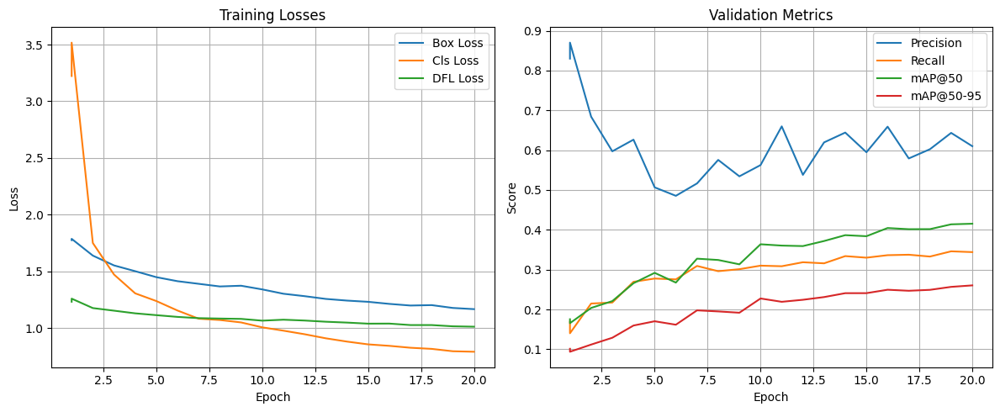

### Box-Level F1 Score Curve

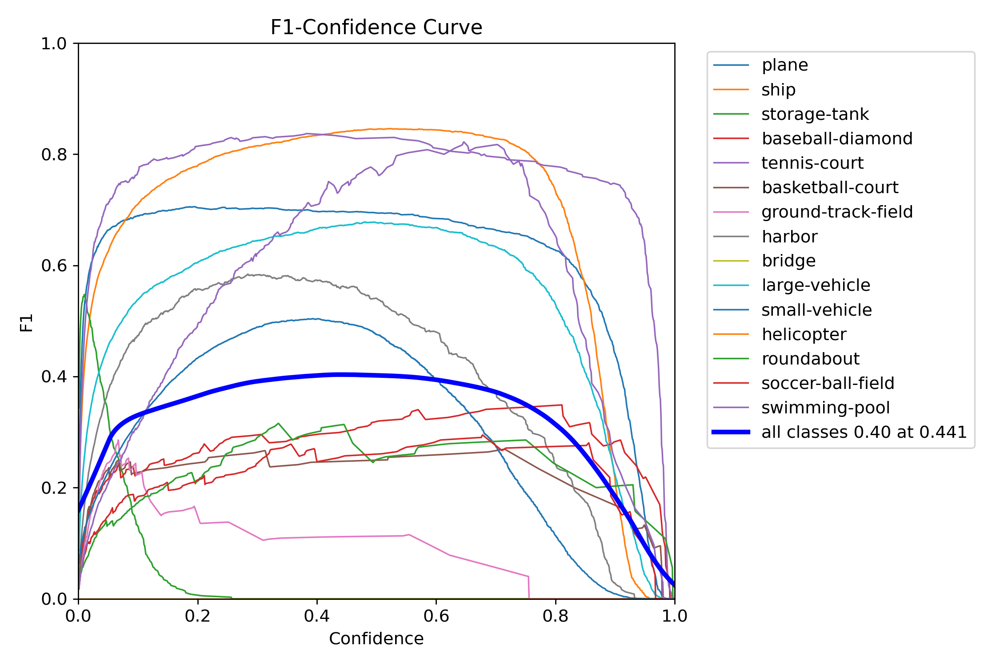

### Precision-Recall Curve

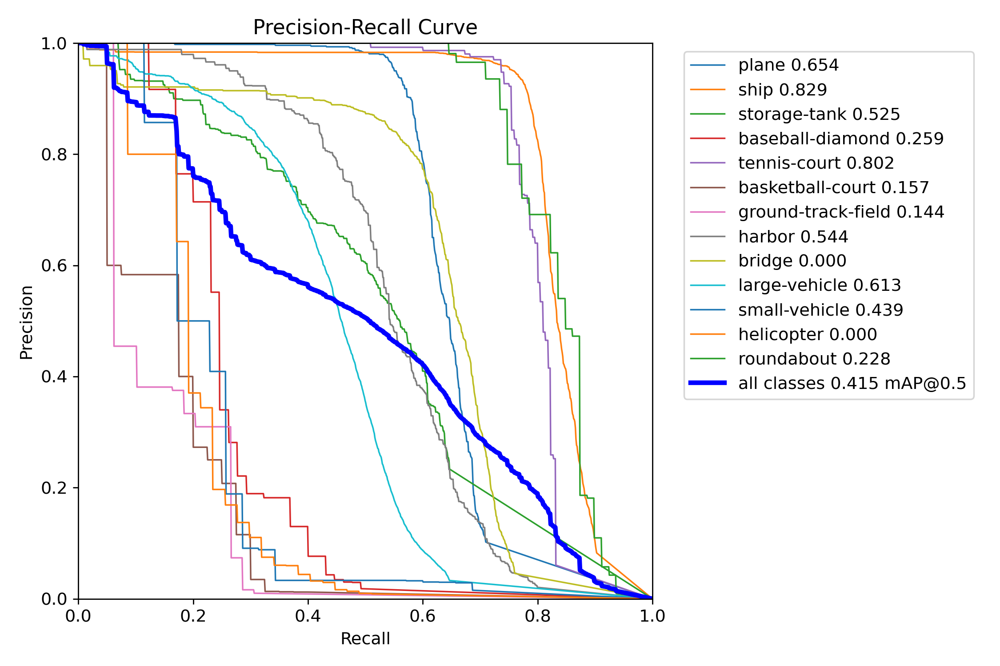

### Box-Level Precision Curve

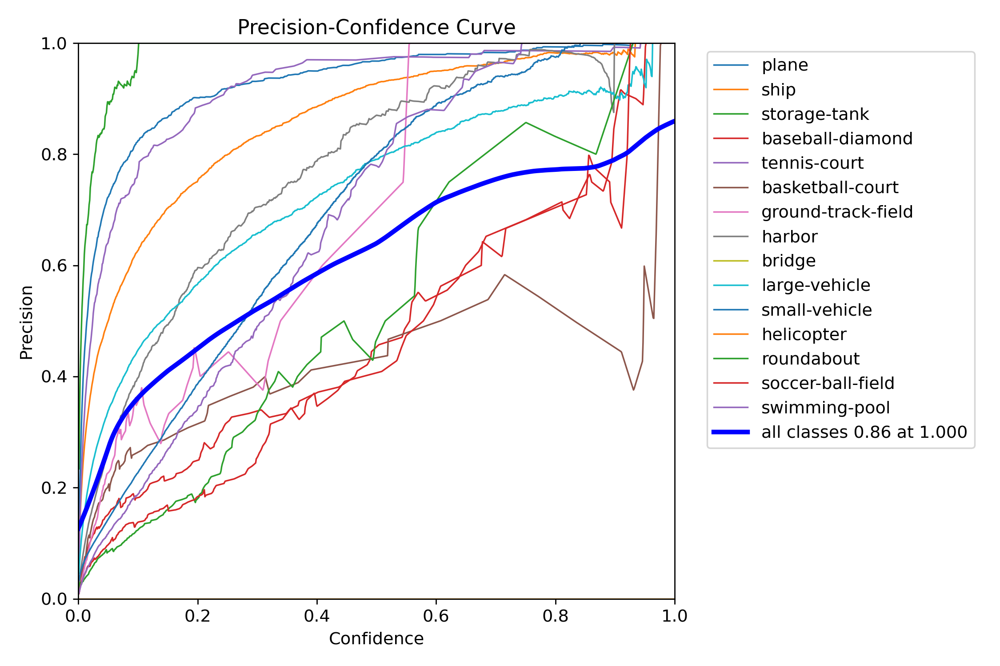

### Box-Level Recall Curve

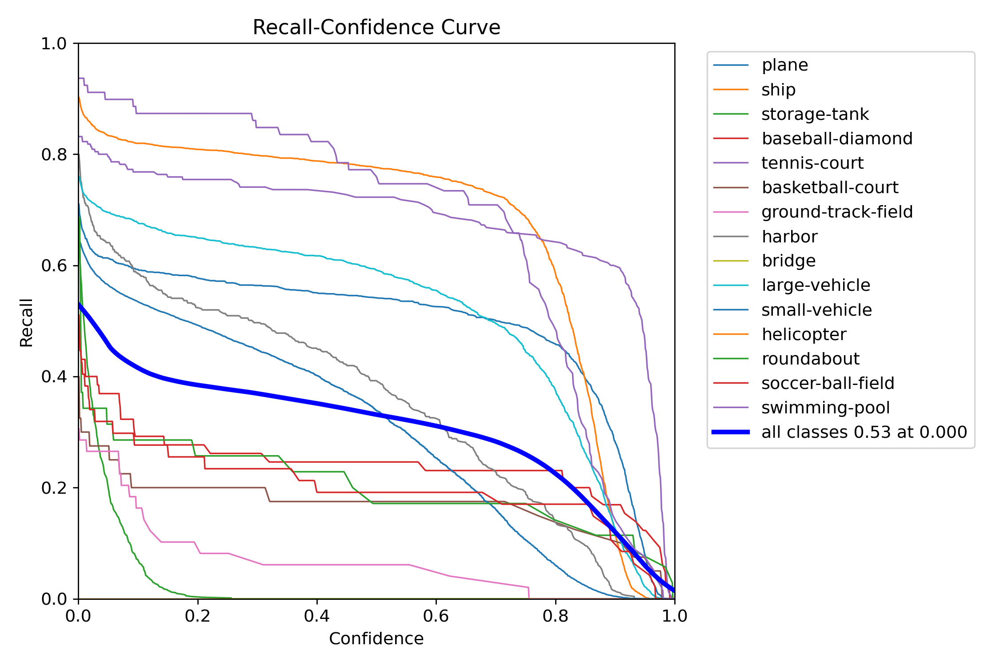

### Raw Confusion Matrix

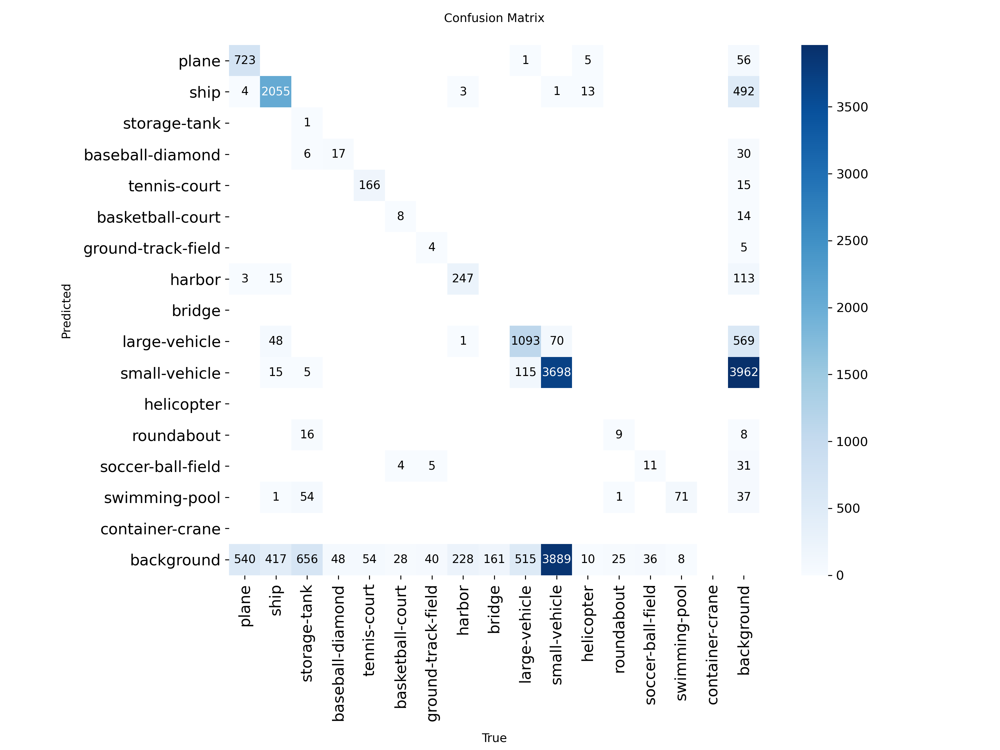

### Normalized Confusion Matrix

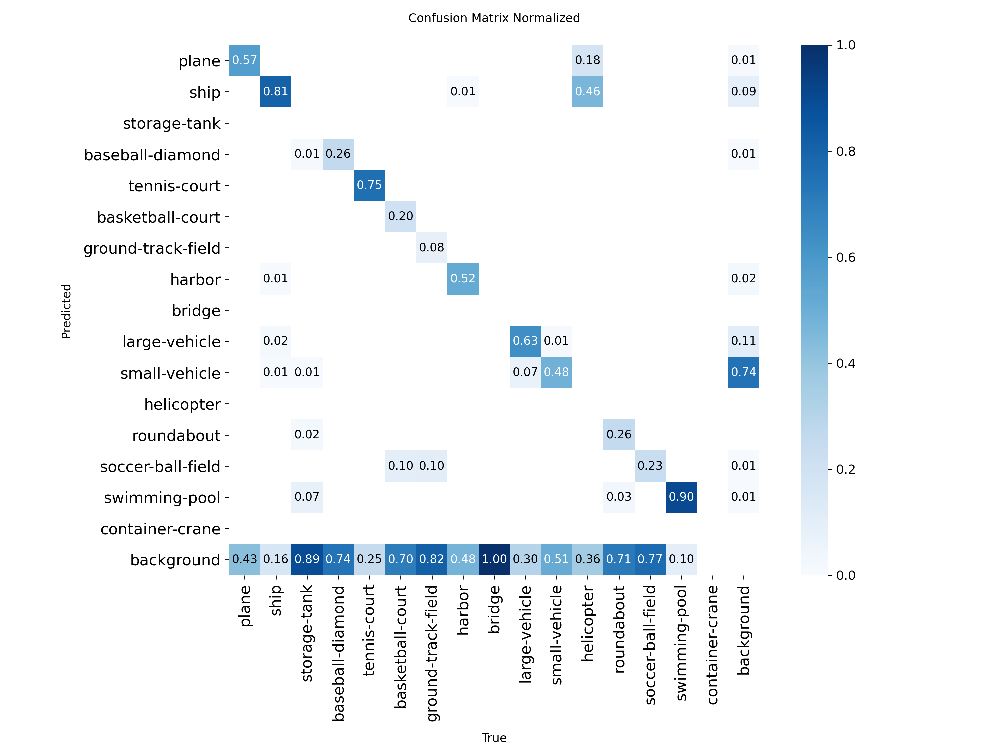

### Training Label Distribution

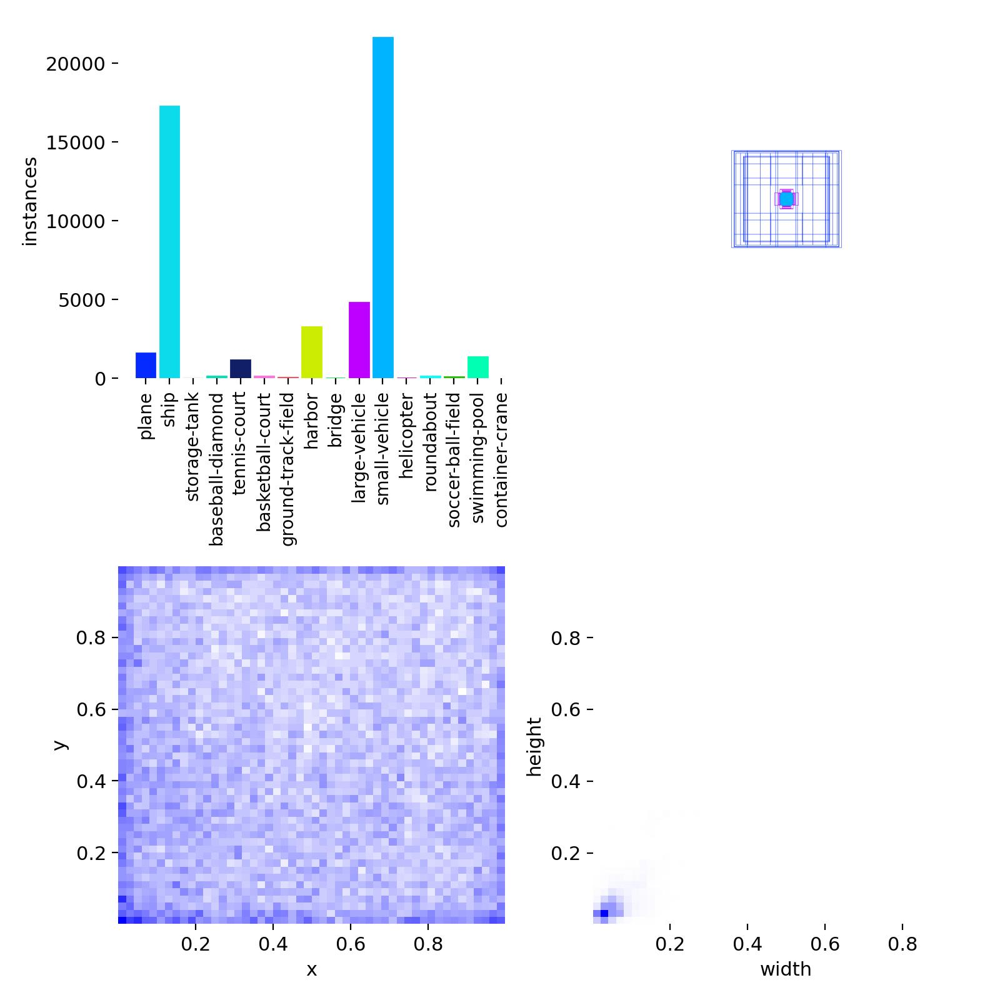

### Label Co-occurrence Matrix

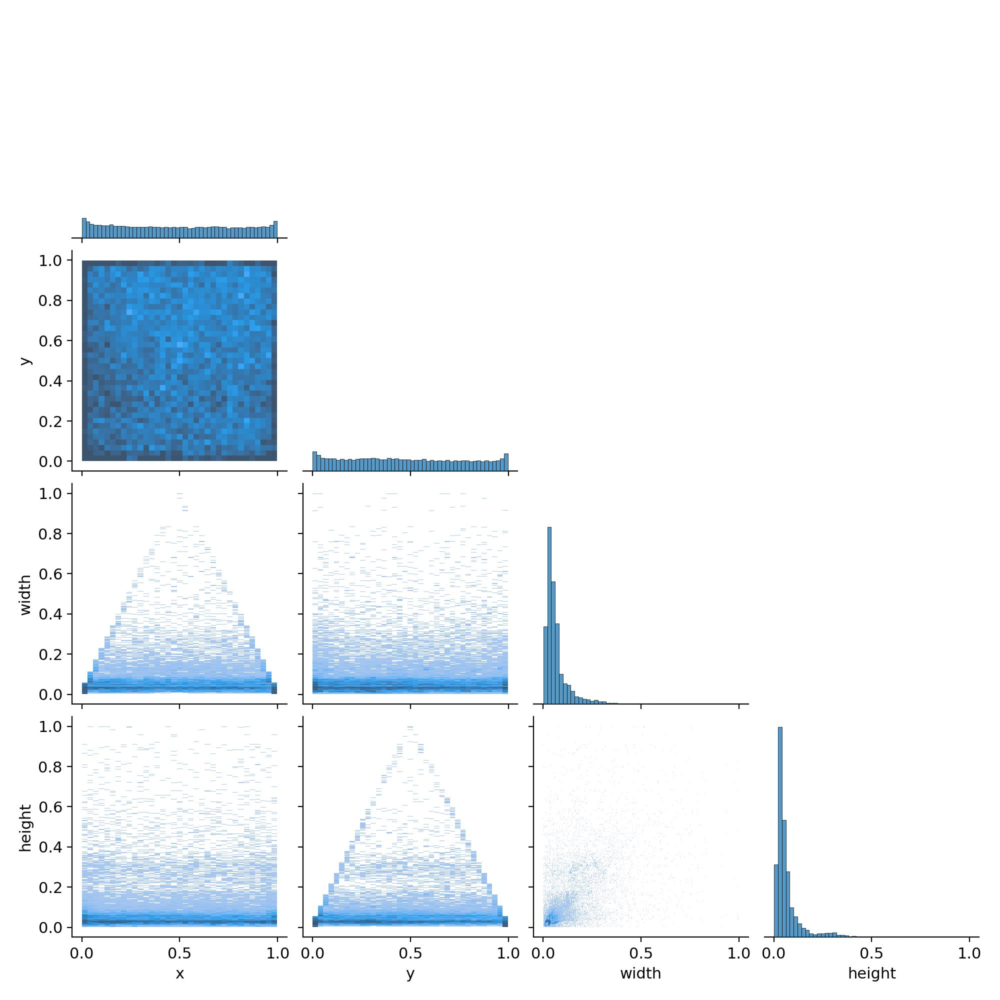

### YOLOv11 Training Summary Graph

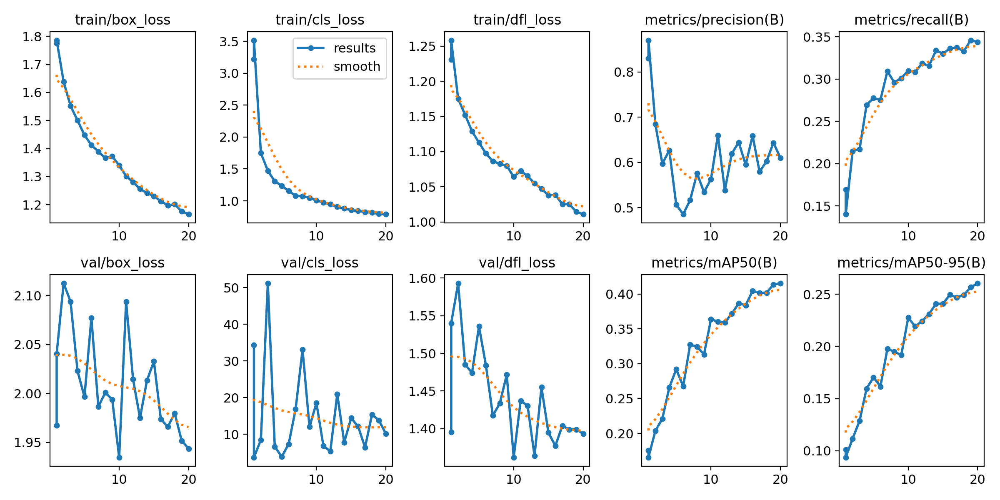

### Train Batch 0 - Labels

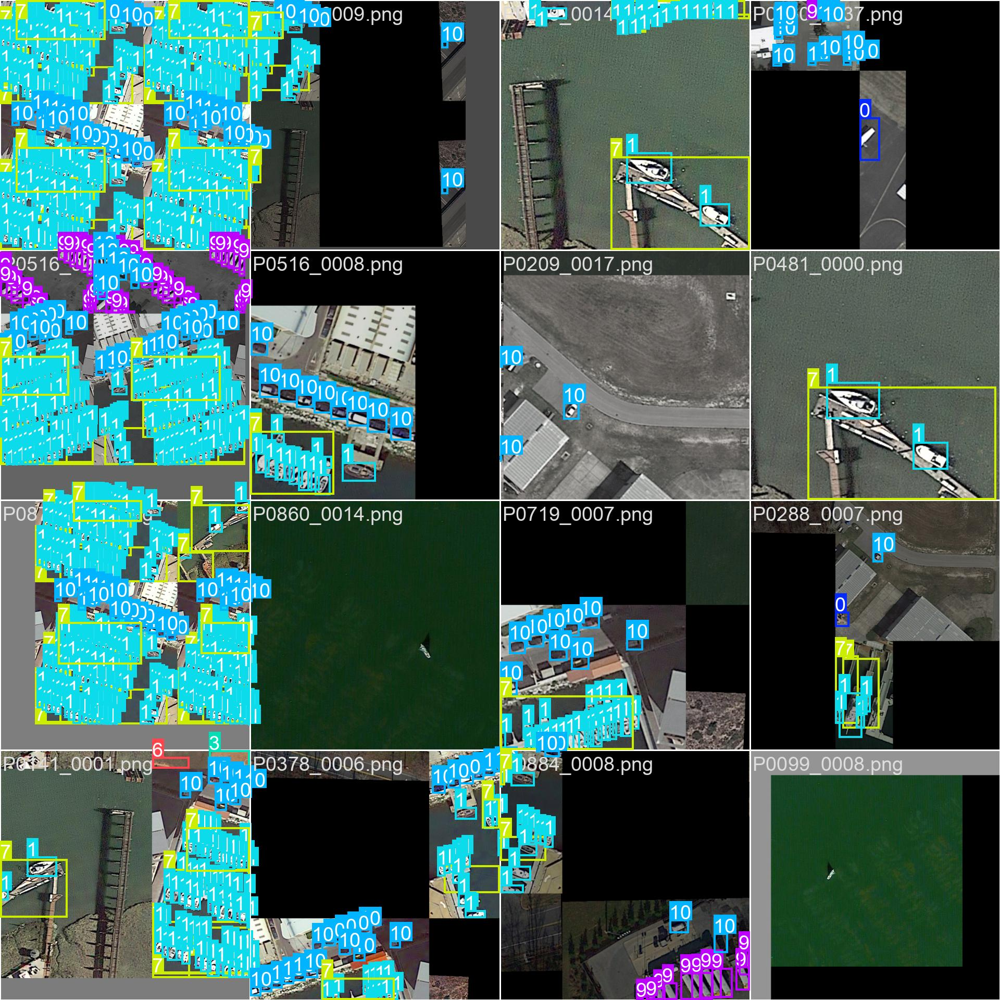

### Train Batch 1 - Labels

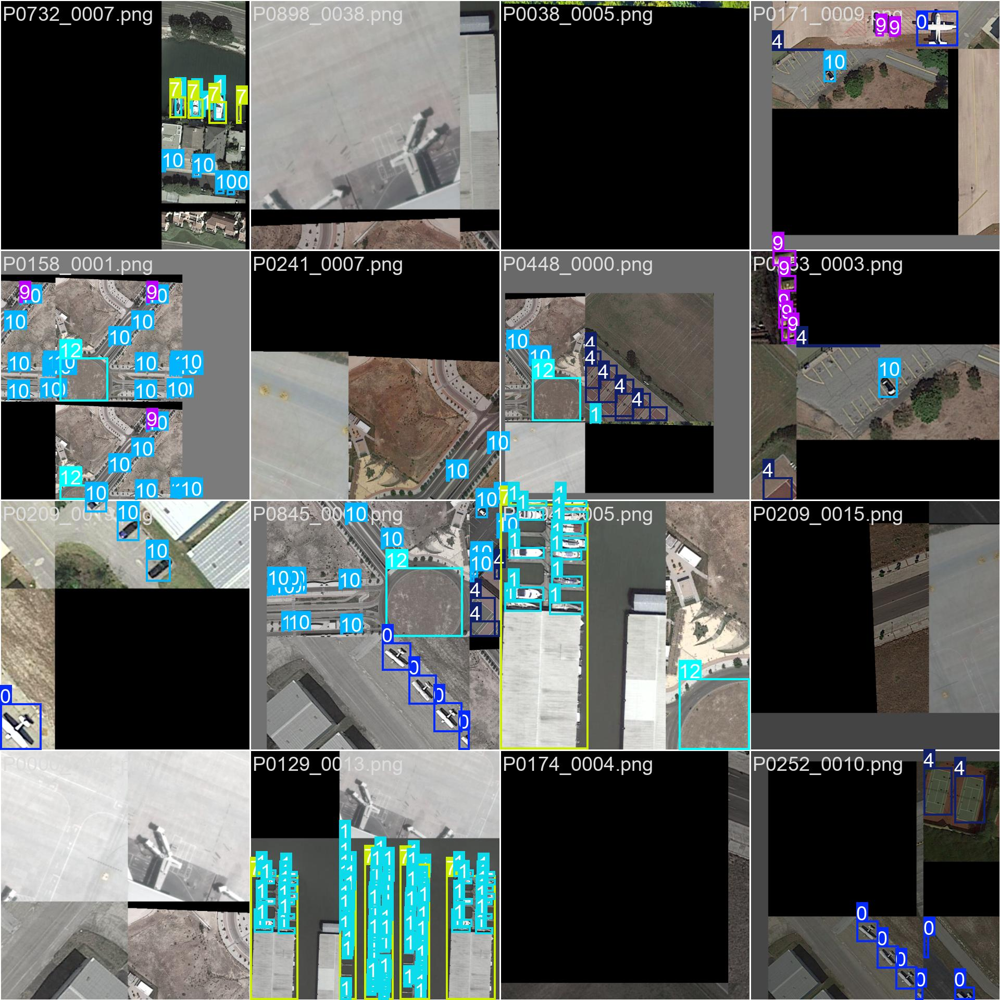

### Train Batch 2 - Labels

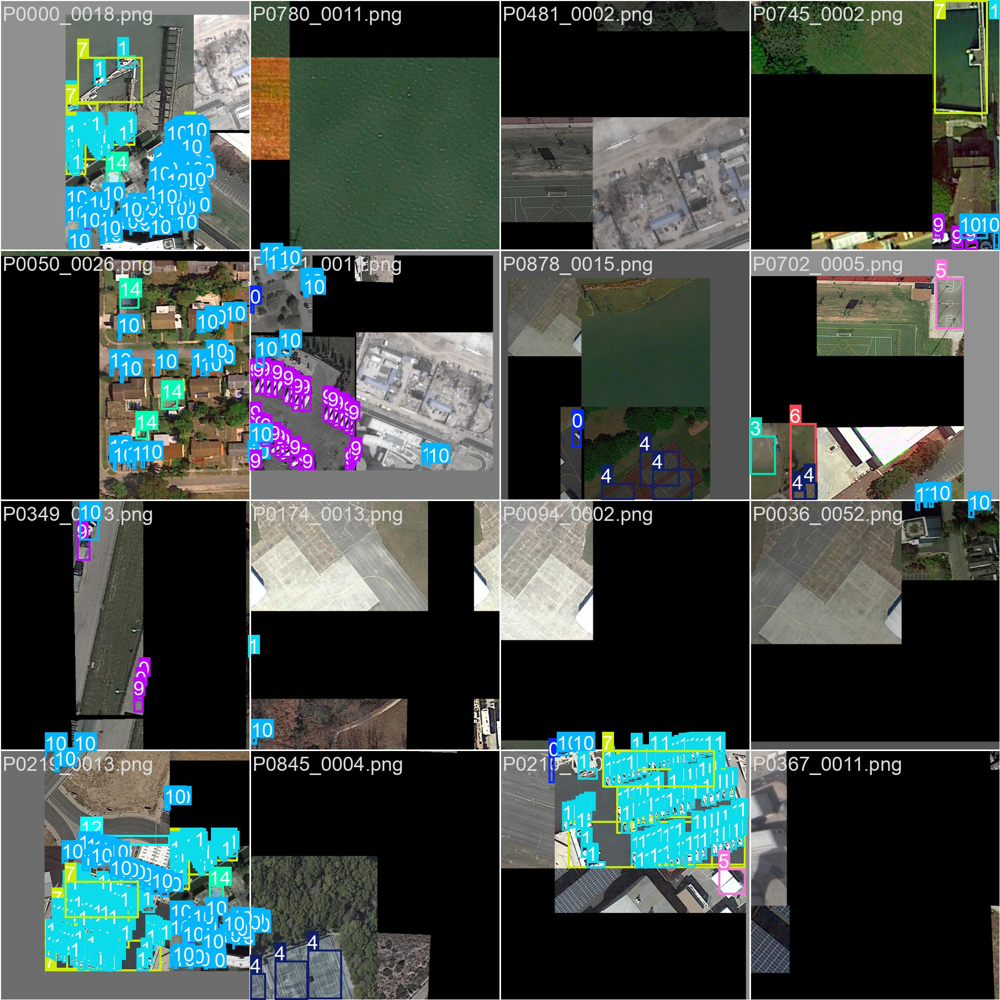

### Validation Batch 0 - Ground Truth

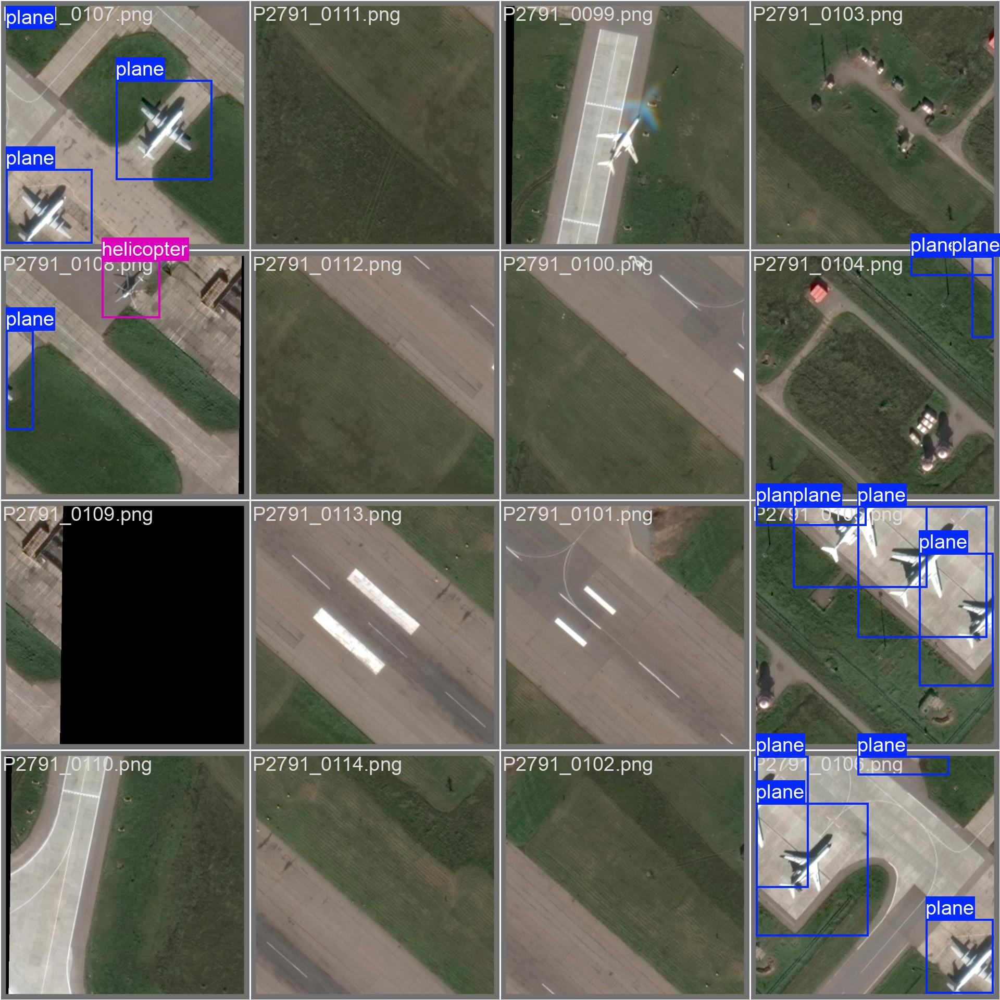

### Validation Batch 0 - Predictions

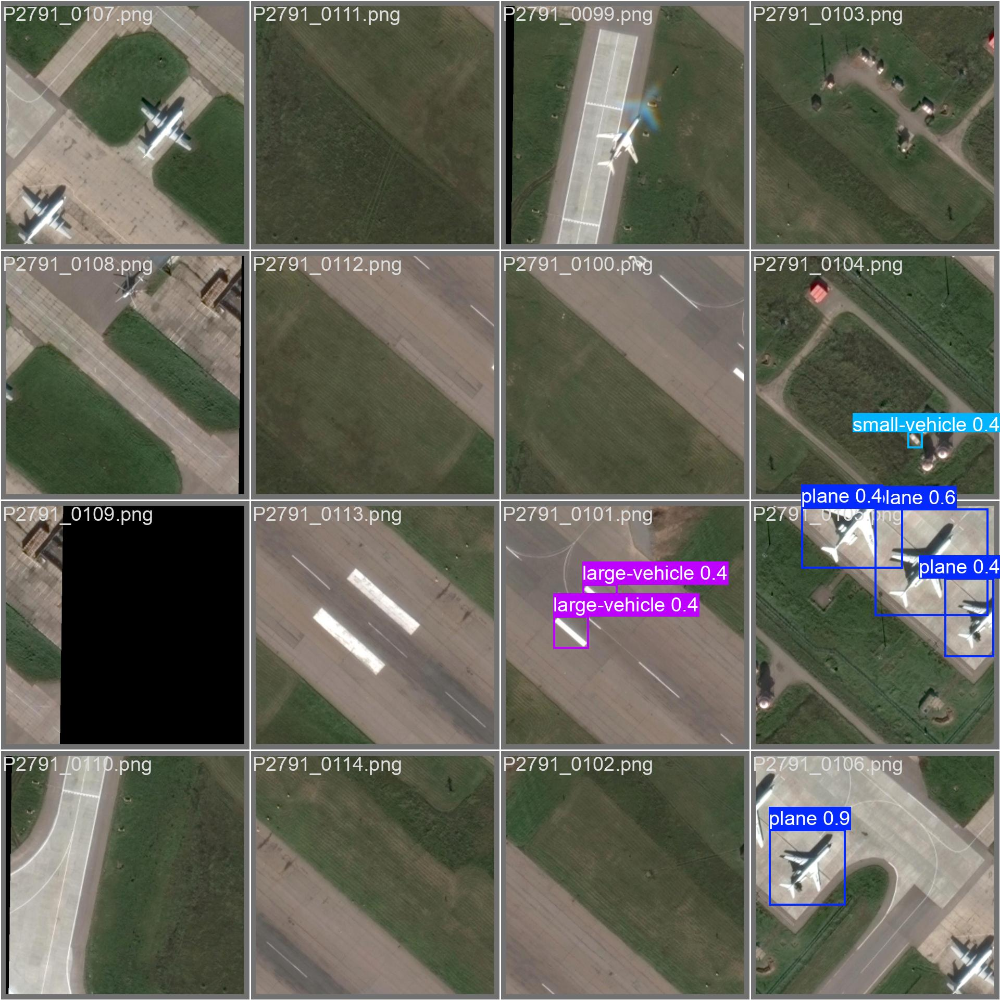

### Validation Batch 1 - Ground Truth

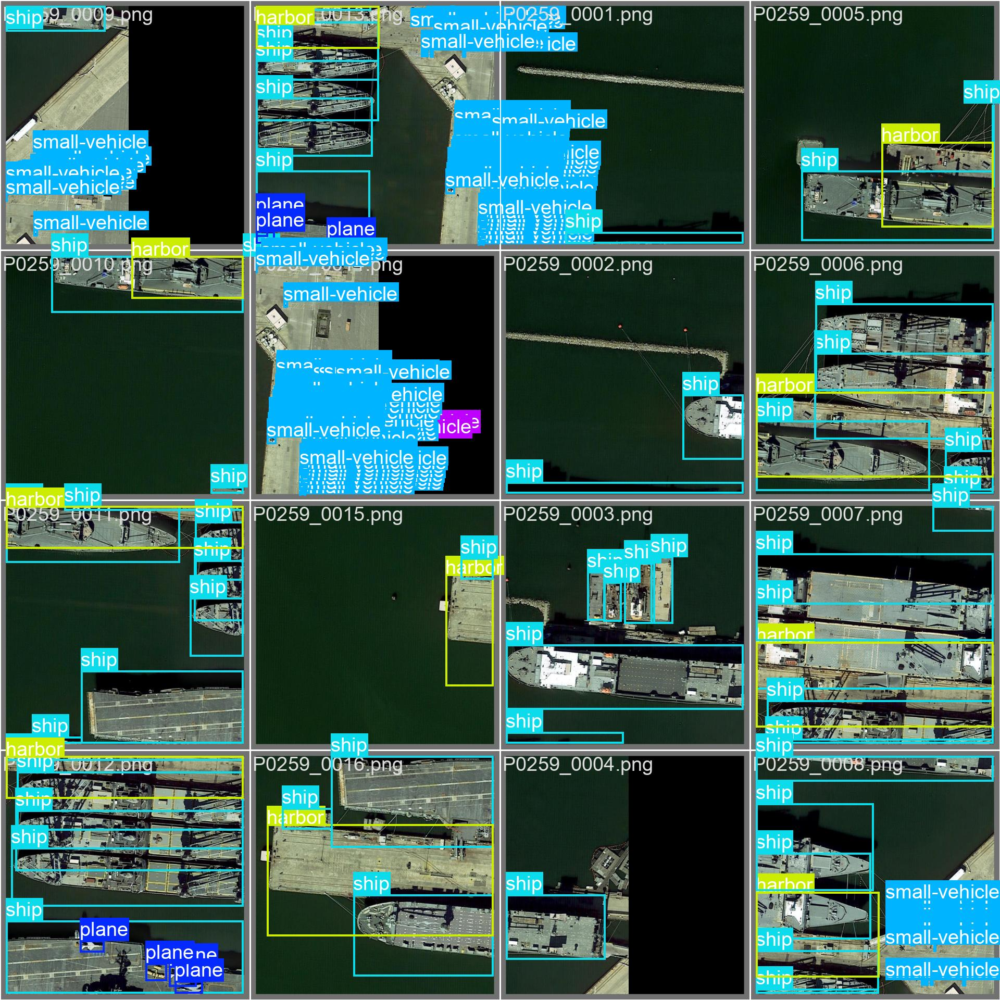

### Validation Batch 1 - Predictions

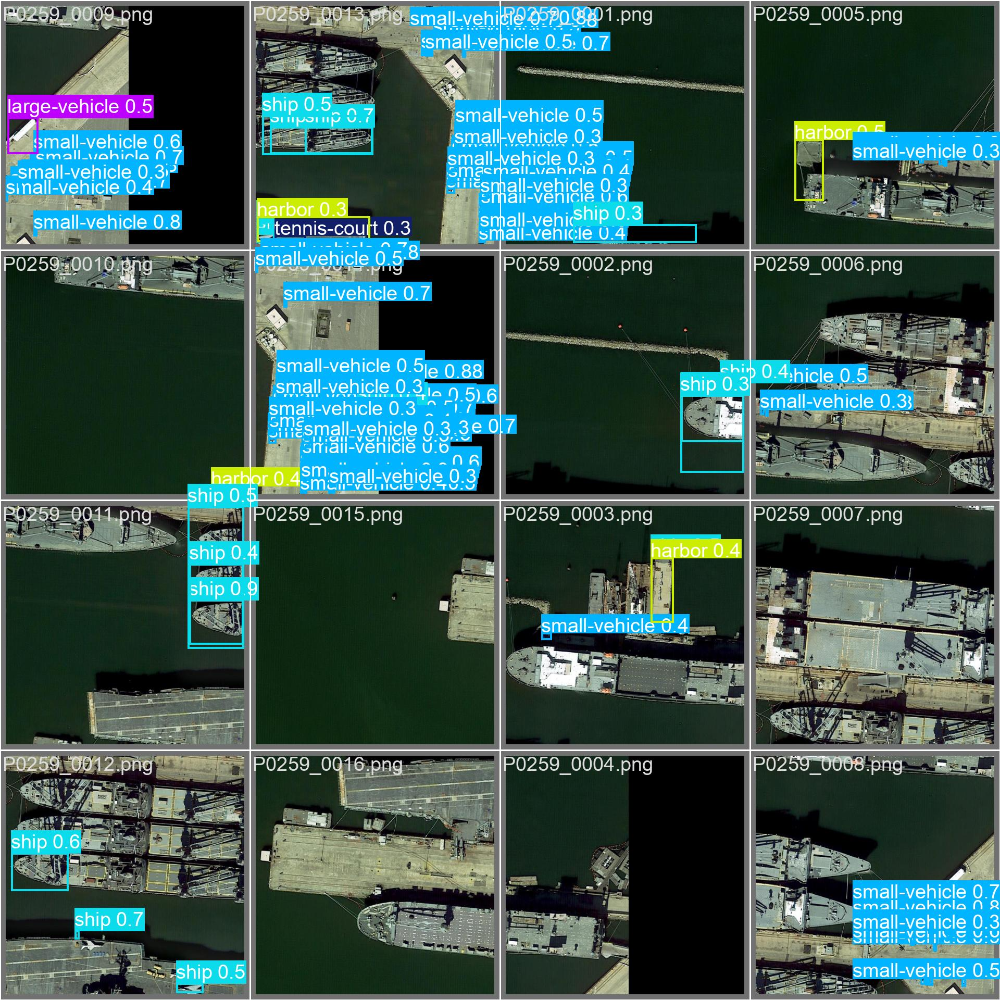

### Validation Batch 2 - Ground Truth

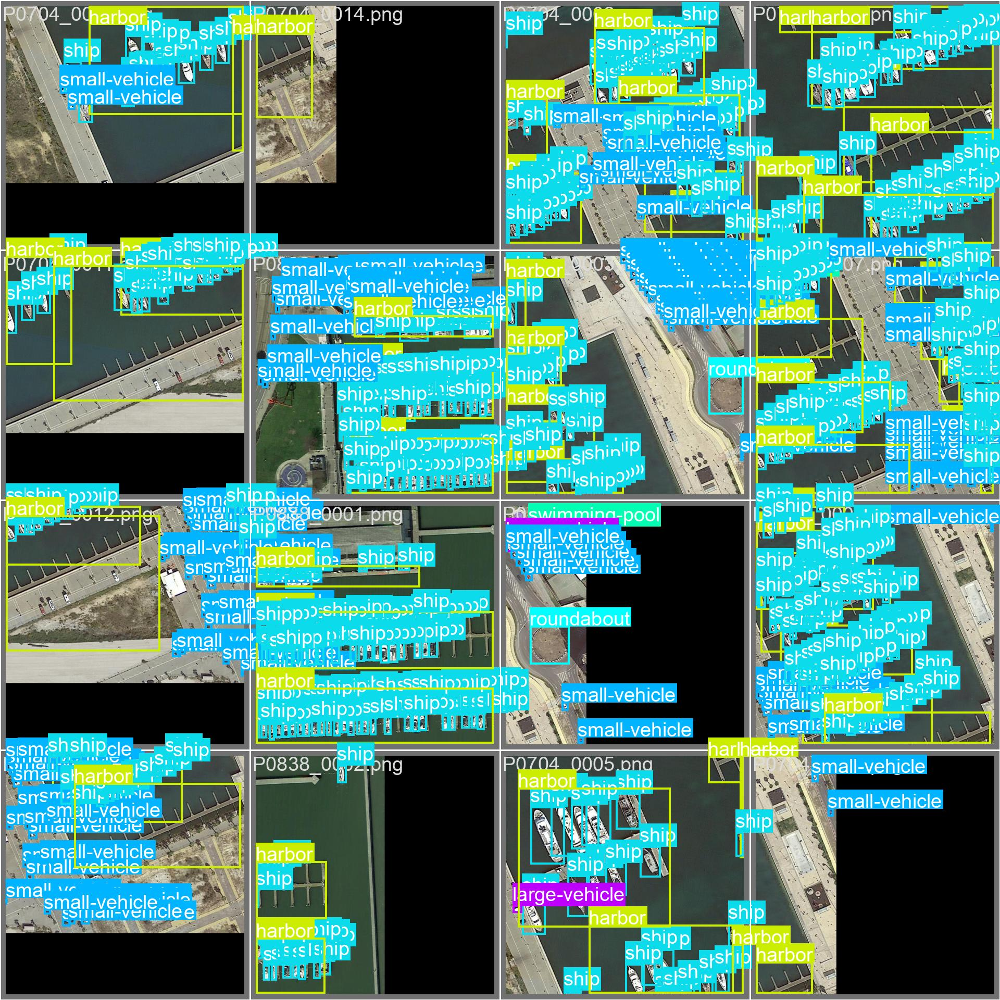

### Validation Batch 2 - Predictions

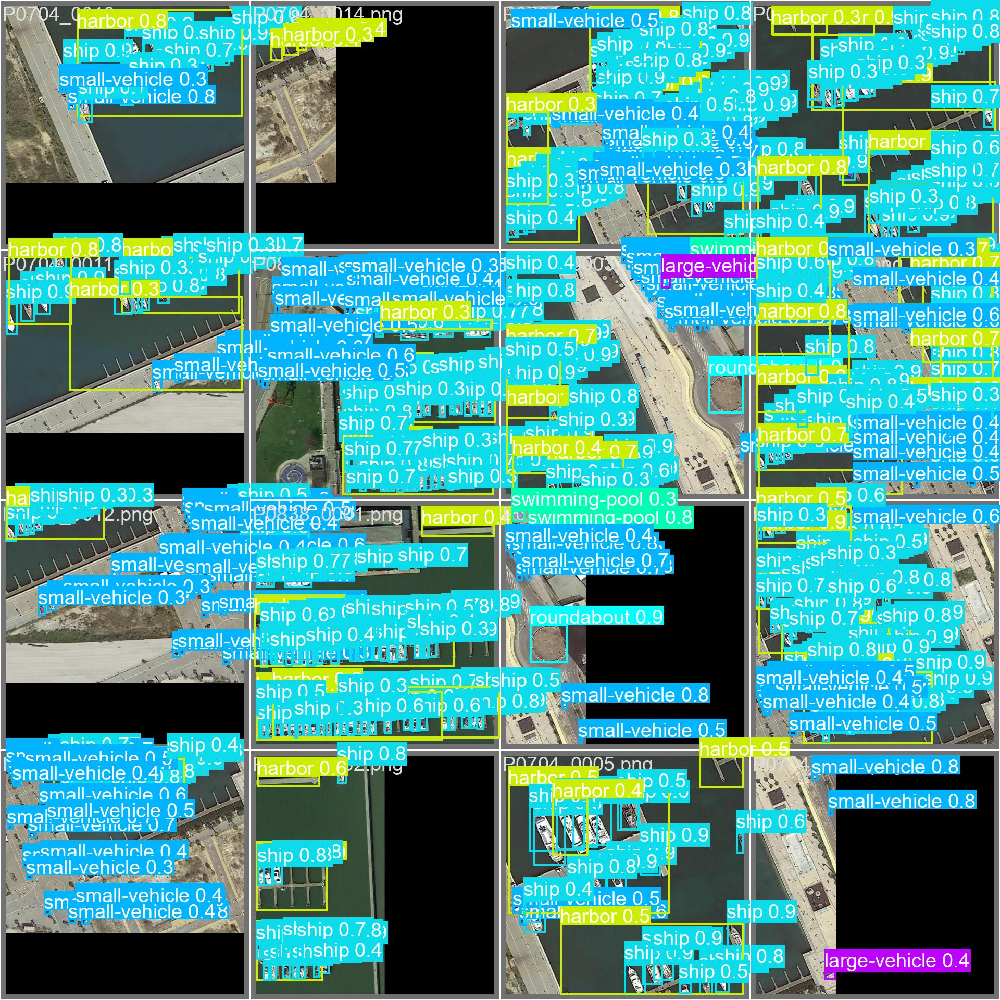

In [41]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Image, Markdown

runs_path = os.path.join(zip_base_path, 'yolo_runs', 'obb_exp')

# Display results.csv as a DataFrame
csv_path = os.path.join(runs_path, 'results.csv')
df = pd.read_csv(csv_path)
display(df)

# Plot key metrics from results.csv
plt.figure(figsize=(12, 5))

# Plot losses
plt.subplot(1, 2, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Box Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Cls Loss')
plt.plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss')
plt.title('Training Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot evaluation metrics
plt.subplot(1, 2, 2)
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@50')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@50-95')
plt.title('Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Image captions
image_labels = {
    'BoxF1_curve.png': 'Box-Level F1 Score Curve',
    'BoxPR_curve.png': 'Precision-Recall Curve',
    'BoxP_curve.png': 'Box-Level Precision Curve',
    'BoxR_curve.png': 'Box-Level Recall Curve',
    'confusion_matrix.png': 'Raw Confusion Matrix',
    'confusion_matrix_normalized.png': 'Normalized Confusion Matrix',
    'labels.jpg': 'Training Label Distribution',
    'labels_correlogram.jpg': 'Label Co-occurrence Matrix',
    'results.png': 'YOLOv11 Training Summary Graph',
    'train_batch0.jpg': 'Train Batch 0 - Labels',
    'train_batch1.jpg': 'Train Batch 1 - Labels',
    'train_batch2.jpg': 'Train Batch 2 - Labels',
    'val_batch0_labels.jpg': 'Validation Batch 0 - Ground Truth',
    'val_batch0_pred.jpg': 'Validation Batch 0 - Predictions',
    'val_batch1_labels.jpg': 'Validation Batch 1 - Ground Truth',
    'val_batch1_pred.jpg': 'Validation Batch 1 - Predictions',
    'val_batch2_labels.jpg': 'Validation Batch 2 - Ground Truth',
    'val_batch2_pred.jpg': 'Validation Batch 2 - Predictions',
}

# Display output images with labels
for img_name in image_labels:
    img_path = os.path.join(runs_path, img_name)
    if os.path.exists(img_path):
        display(Markdown(f"### {image_labels[img_name]}"))
        display(Image(filename=img_path))
    else:
        print(f'Not found: {img_name}')

It is clear that with only 20 epochs, there is room for improvement as the mAP scores are consistenty increasing. All graphs for the results of this experiment are shown above, including side-by-side comparisons of ground truth and prediction annotated image batches.